In [1]:
import numpy as np
import scanpy as sc
import torch

import matplotlib.pyplot as plt
from scarches.dataset.trvae.data_handling import remove_sparsity
from lataq.model import TRANVAE
from sklearn.metrics import classification_report

sc.settings.set_figure_params(dpi=200, frameon=False)
sc.set_figure_params(dpi=200)
torch.set_printoptions(precision=3, sci_mode=False, edgeitems=7)

In [2]:
unlabeled_strat = "batch"
cells_per_ct = 2000

# Model Params
latent_dim = 10
use_mmd = False

# Training Params
alpha_epoch_anneal = 1e6
eta = 1
tau = 0
clustering_res = 2
labeled_loss_metric = "dist"
unlabeled_loss_metric = "dist"
class_metric = "dist"

early_stopping_kwargs = {
    "early_stopping_metric": "val_classifier_loss",
    "mode": "min",
    "threshold": 0,
    "patience": 20,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}

cell_type_key = ["cell_type"]

In [3]:
DATA_DIR = '../data/'
adata = sc.read(
    f'{DATA_DIR}/adata_lung_subsampled.h5ad')
condition_key = "study"
cell_type_key = ["ann_level_1", "ann_level_2"]
reference = ["Stanford_Krasnow_bioRxivTravaglini", "Misharin_new"]
query = ["Vanderbilt_Kropski_bioRxivHabermann_vand", "Sanger_Teichmann_2019VieiraBraga"]
adata.obs['query'] = adata.obs['study'].isin(query).astype('category')

In [4]:
source_adata = adata[adata.obs.study.isin(reference)].copy()
target_adata = adata[adata.obs.study.isin(query)].copy()

In [5]:
adata = remove_sparsity(adata)

indices = np.arange(len(adata))
#stratified label/unlabeled split
if unlabeled_strat == "batch":
    labeled_ind = indices[adata.obs.study.isin(reference)].tolist()
    labeled_adata = adata[adata.obs.study.isin(reference)].copy()
    unlabeled_adata = adata[adata.obs.study.isin(query)].copy()
if unlabeled_strat == "ct":
    labeled_ind = []
    cts = adata.obs[cell_type_key[0]].unique().tolist()
    for celltype in cts:
        ct_indices = indices[adata.obs[cell_type_key[0]].isin([celltype])]
        ct_sel_ind = np.random.choice(ct_indices, size=cells_per_ct, replace=False)
        labeled_ind += ct_sel_ind.tolist()
        print(celltype, len(ct_indices), len(ct_sel_ind), len(labeled_ind))
    unlabeled_ind = np.delete(indices, labeled_ind).tolist()
    labeled_adata = adata[labeled_ind].copy()
    unlabeled_adata = adata[unlabeled_ind].copy()

In [6]:
tranvae = TRANVAE(
    adata=source_adata,
    condition_key=condition_key,
    cell_type_keys=cell_type_key,
    hidden_layer_sizes=[128, 128],
    latent_dim=latent_dim,
    use_mmd=use_mmd,
)


INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 2000 128 2
	Hidden Layer 1 in/out: 128 128
	Mean/Var Layer in/out: 128 10
Decoder Architecture:
	First Layer in, out and cond:  10 128 2
	Hidden Layer 1 in/out: 128 128
	Output Layer in/out:  128 2000 



In [7]:
tranvae.train(
    n_epochs=100,
    early_stopping_kwargs=early_stopping_kwargs,
    pretraining_epochs=20,
    alpha_epoch_anneal=alpha_epoch_anneal,
    eta=eta,
    tau=tau,
    clustering_res=clustering_res,
    labeled_loss_metric=labeled_loss_metric,
    unlabeled_loss_metric=unlabeled_loss_metric
)

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/home/icb/carlo.dedonno/anaconda3/envs/lataq/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3441, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-7-7f58ba81c360>", line 1, in <module>
    tranvae.train(
  File "/storage/groups/ml01/workspace/carlo.dedonno/LATAQ/lataq/model/lataq_model.py", line 169, in train
    self.trainer.train(n_epochs, lr, eps)
  File "/home/icb/carlo.dedonno/anaconda3/envs/lataq/lib/python3.8/site-packages/scArches-0.3.5-py3.8.egg/scarches/trainers/trvae/trainer.py", line 206, in train
    self.initialize_loaders()
  File "/home/icb/carlo.dedonno/anaconda3/envs/lataq/lib/python3.8/site-packages/scArches-0.3.5-py3.8.egg/scarches/trainers/trvae/trainer.py", line 156, in initialize_loaders
    stratifier_weights = torch.tensor(self.train_data.stratifier_weights, device=self.device)
  File "/home/icb/carlo.dedonno/anaconda3/envs/lataq/lib/python3.8/site-packages/s

TypeError: object of type 'NoneType' has no len()

In [8]:
ref_path = f'../pr/ref_model_hierarchical'
tranvae.save(ref_path, overwrite=True)

In [10]:
data_latent = tranvae.get_latent(x=source_adata.X.A, c=source_adata.obs[condition_key])
adata_latent = sc.AnnData(data_latent)
adata_latent.obs[condition_key] = source_adata.obs[condition_key].tolist()
for k in cell_type_key:
    adata_latent.obs[k] = source_adata.obs[k].tolist()

In [11]:
landmarks = tranvae.get_landmarks_info()
full_latent = adata_latent.concatenate(landmarks, batch_key=None)

In [12]:
sc.pp.neighbors(adata_latent)
sc.tl.leiden(adata_latent)
sc.tl.umap(adata_latent)

In [13]:
adata_latent.obs

,study,ann_level_1,ann_level_2,leiden
0,Stanford_Krasnow_bioRxivTravaglini,Epithelial,Alveolar epithelium,0
1,Misharin_new,Stroma,Fibroblast lineage,10
2,Stanford_Krasnow_bioRxivTravaglini,Immune,Myeloid,2
3,Misharin_new,Epithelial,Alveolar epithelium,0
4,Misharin_new,Immune,Myeloid,21
...,...,...,...,...
89299,Stanford_Krasnow_bioRxivTravaglini,Epithelial,Airway epithelium,15
89300,Stanford_Krasnow_bioRxivTravaglini,Immune,Myeloid,3
89301,Misharin_new,Epithelial,Alveolar epithelium,0
89302,Stanford_Krasnow_bioRxivTravaglini,Immune,Lymphoid,4


... storing 'study' as categorical
... storing 'ann_level_1' as categorical
... storing 'ann_level_2' as categorical


[<AxesSubplot:title={'center':'study'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'ann_level_1'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'ann_level_2'}, xlabel='UMAP1', ylabel='UMAP2'>]

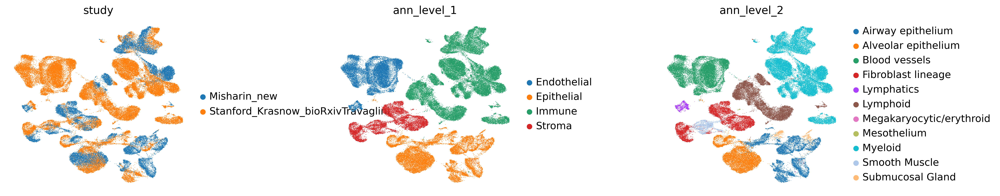

In [14]:
sc.pl.umap(adata_latent,
           color=['study', 'ann_level_1', 'ann_level_2'],
           frameon=False,
           wspace=0.6,
           show=False
           )


In [43]:
sc.pp.neighbors(adata)
sc.tl.leiden(adata)
sc.tl.umap(adata)

         Falling back to preprocessing with `sc.pp.pca` and default params.


[<AxesSubplot:title={'center':'study'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'query'}, xlabel='UMAP1', ylabel='UMAP2'>]

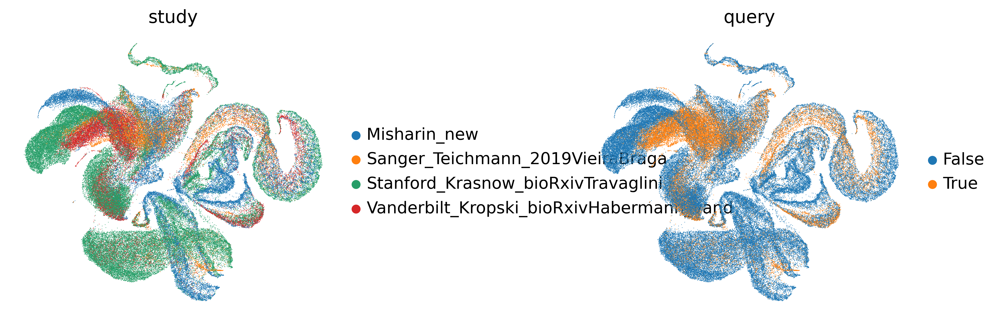

In [44]:
sc.pl.umap(adata,
           color=['study', 'query'],
           frameon=False,
           wspace=0.6,
           show=False
           )

In [15]:
tranvae = TRANVAE.load_query_data(
    adata=target_adata,
    reference_model=f'../pr/ref_model_hierarchical',
    labeled_indices=[],
)

AnnData object with n_obs × n_vars = 33092 × 2000
    obs: 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'study', 'query'

INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 2000 128 4
	Hidden Layer 1 in/out: 128 128
	Mean/Var Layer in/out: 128 10
Decoder Architecture:
	First Layer in, out and cond:  10 128 4
	Hidden Layer 1 in/out: 128 128
	Output Layer in/out:  128 2000 



In [16]:
tranvae.train(
    n_epochs=50,
    early_stopping_kwargs=early_stopping_kwargs,
    pretraining_epochs=10,
    eta=eta,
    tau=tau,
    weight_decay=0,
    clustering_res=clustering_res,
    labeled_loss_metric=labeled_loss_metric,
    unlabeled_loss_metric=unlabeled_loss_metric
)

 |████----------------| 20.0%  - val_loss: 858.8808358999 - val_trvae_loss: 858.88083589992
Initializing unlabeled landmarks with Leiden-Clustering with an unknown number of clusters.
Leiden Clustering succesful. Found 45 clusters.
 |████████████████████| 100.0%  - val_loss: 833.1211641752 - val_trvae_loss: 833.1211031400 - val_classifier_loss: 0.0000426534 - val_unlabeled_loss: 0.0426533492
Saving best state of network...
Best State was in Epoch 39


In [17]:
data_latent = tranvae.get_latent(
    x=adata.X,
    c=adata.obs[condition_key]
)

In [20]:
adata_latent_wquery = sc.AnnData(data_latent)
adata_latent_wquery.obs[condition_key] = adata.obs[condition_key].tolist()
for k in cell_type_key:
    adata_latent_wquery.obs[k] = adata.obs[k].tolist()
    adata_latent_wquery.obs[k] = adata_latent_wquery.obs[k].astype('category')

In [21]:
sc.pp.neighbors(adata_latent_wquery)
sc.tl.leiden(adata_latent_wquery)
sc.tl.umap(adata_latent_wquery)

<AxesSubplot:title={'center':'study'}, xlabel='UMAP1', ylabel='UMAP2'>

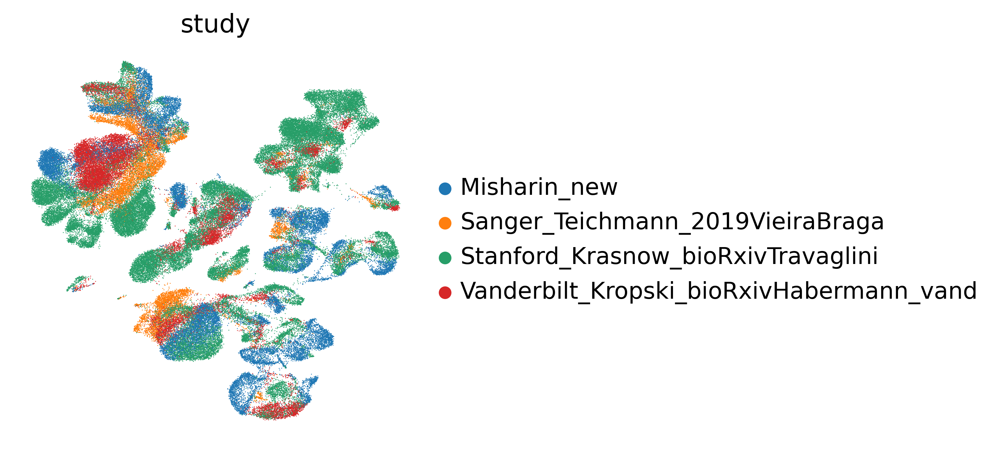

In [42]:
sc.pl.umap(adata_latent_wquery,
           color=['study'],
           frameon=False,
           wspace=0.6,
           show=False
           )

In [24]:
results_dict = tranvae.classify(adata.X, adata.obs[condition_key], metric=class_metric)
for i in range(len(cell_type_key)):
    preds = results_dict[cell_type_key[i]]['preds']
    probs = results_dict[cell_type_key[i]]['probs']
    results_dict[cell_type_key[i]]['report'] = classification_report(
        y_true=adata.obs[cell_type_key[i]], 
        y_pred=preds,
        output_dict=True
    )

    correct_probs = probs[preds == adata.obs[cell_type_key[i]]]
    incorrect_probs = probs[preds != adata.obs[cell_type_key[i]]]
    data = [correct_probs, incorrect_probs]

    checks = np.array(len(adata) * ['incorrect'])
    checks[preds == adata.obs[cell_type_key[i]]] = 'correct'
    adata_latent_wquery.obs[cell_type_key[i]] = adata.obs[cell_type_key[i]].tolist()
    adata_latent_wquery.obs[f'{cell_type_key[i]}_pred'] = preds.tolist()
    adata_latent_wquery.obs[f'{cell_type_key[i]}_bool'] = checks.tolist()

In [25]:
results_dict['ann_level_1']['report']

{'Endothelial': {'precision': 0.9984502531253229,
  'recall': 0.9979347377116894,
  'f1-score': 0.9981924288591644,
  'support': 19368},
 'Epithelial': {'precision': 0.9942926016519551,
  'recall': 0.9978653764052938,
  'f1-score': 0.9960757852868583,
  'support': 28108},
 'Immune': {'precision': 0.9985422509546672,
  'recall': 0.9993181313627858,
  'f1-score': 0.9989300404999485,
  'support': 63062},
 'Stroma': {'precision': 0.9988905956647892,
  'recall': 0.9870973182661494,
  'f1-score': 0.9929589412962334,
  'support': 11858},
 'accuracy': 0.9975816203143894,
 'macro avg': {'precision': 0.9975439253491837,
  'recall': 0.9955538909364796,
  'f1-score': 0.996539298985551,
  'support': 122396},
 'weighted avg': {'precision': 0.9975855180141564,
  'recall': 0.9975816203143894,
  'f1-score': 0.9975793528782461,
  'support': 122396}}

... storing 'ann_level_1' as categorical
... storing 'ann_level_2' as categorical
... storing 'ann_level_1_pred' as categorical
... storing 'ann_level_1_bool' as categorical
... storing 'ann_level_2_pred' as categorical
... storing 'ann_level_2_bool' as categorical


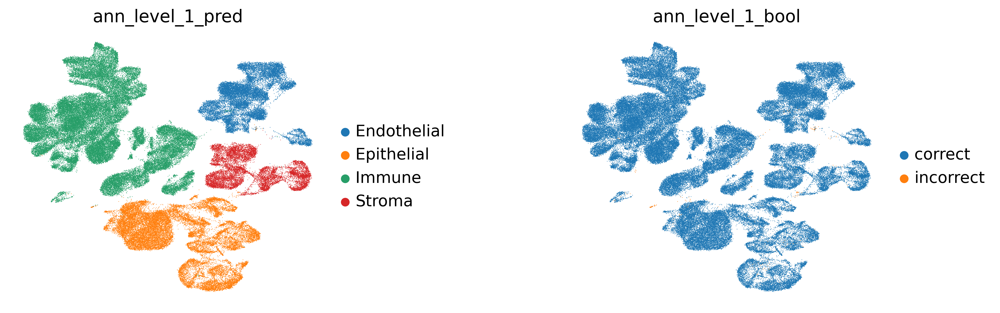

In [26]:
sc.pl.umap(
    adata_latent_wquery,
    color=['ann_level_1_pred', 'ann_level_1_bool'],
    wspace=0.6,
    frameon=False
)

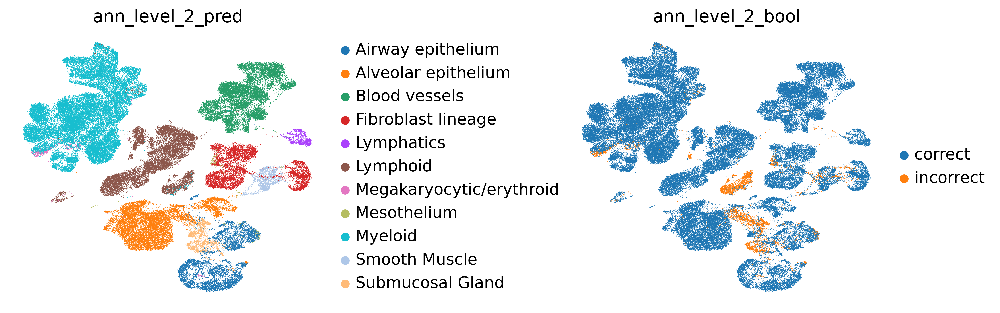

In [27]:
sc.pl.umap(
    adata_latent_wquery,
    color=['ann_level_2_pred', 'ann_level_2_bool'],
    wspace=0.6,
    frameon=False
)

In [45]:
adata_latent_wquery.obs['query'] = adata.obs['query'].tolist()
adata_latent_wquery.obs['query'] = adata_latent_wquery.obs['query'].astype('category')

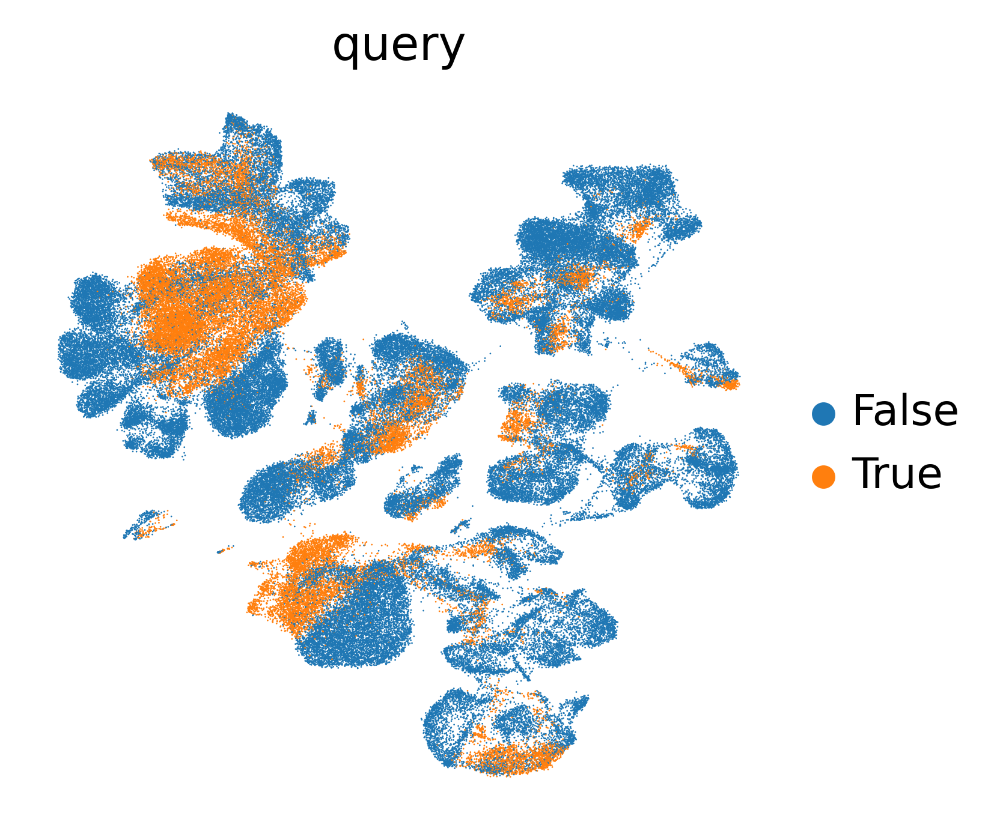

In [46]:
sc.pl.umap(
    adata_latent_wquery,
    color=['query'],
    wspace=0.6,
    frameon=False
)

In [38]:
f1_1 = list()
prec = list()
recall = list()
level = 'ann_level_1'
for key in list(results_dict[level]['report'].keys())[:-3]:
    print(key)
    f1_1.append(results_dict[level]['report'][key]['f1-score'])
    prec.append(results_dict[level]['report'][key]['precision'])
    recall.append(results_dict[level]['report'][key]['recall'])

Endothelial
Epithelial
Immune
Stroma


In [35]:
f1_2 = list()
prec = list()
recall = list()
level = 'ann_level_2'
for key in list(results_dict[level]['report'].keys())[:-3]:
    print(key)
    f1_2.append(results_dict[level]['report'][key]['f1-score'])
    prec.append(results_dict[level]['report'][key]['precision'])
    recall.append(results_dict[level]['report'][key]['recall'])

Airway epithelium
Alveolar epithelium
Blood vessels
Fibroblast lineage
Lymphatics
Lymphoid
Megakaryocytic/erythroid
Mesothelium
Myeloid
Smooth Muscle
Submucosal Gland


/home/icb/carlo.dedonno/anaconda3/envs/lataq/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'F1 score')

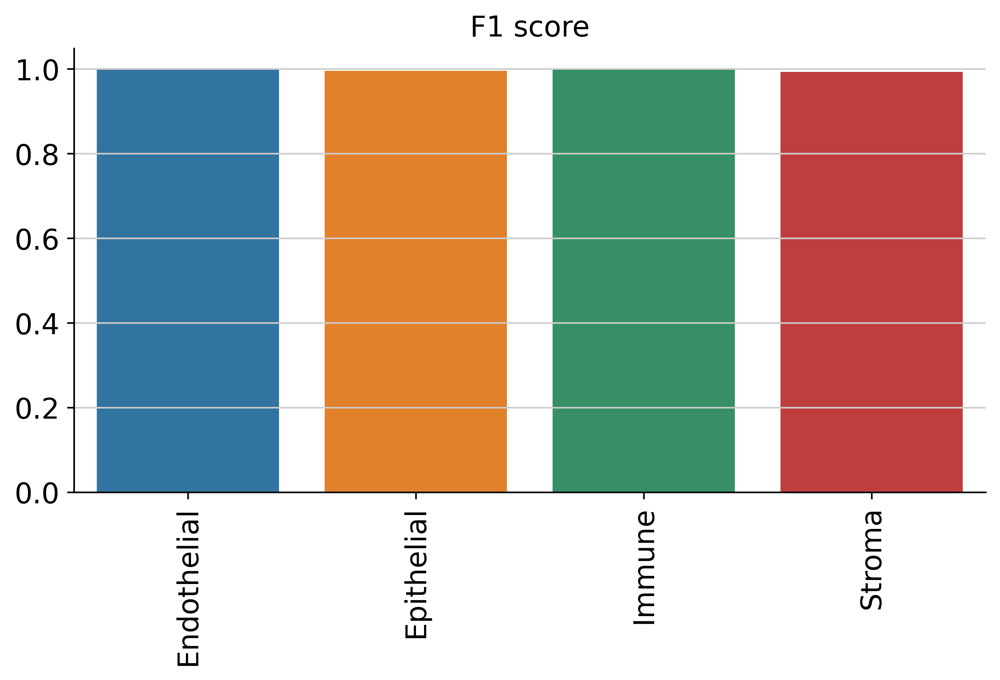

In [39]:
import seaborn as sns
fig, ax = plt.subplots(1, 1, figsize=(8, 4))
sns.barplot(
    list(results_dict[level]['report'].keys())[:-3],
    f1_1,
)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
sns.despine()
ax.set_title('F1 score')

/home/icb/carlo.dedonno/anaconda3/envs/lataq/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'F1 score')

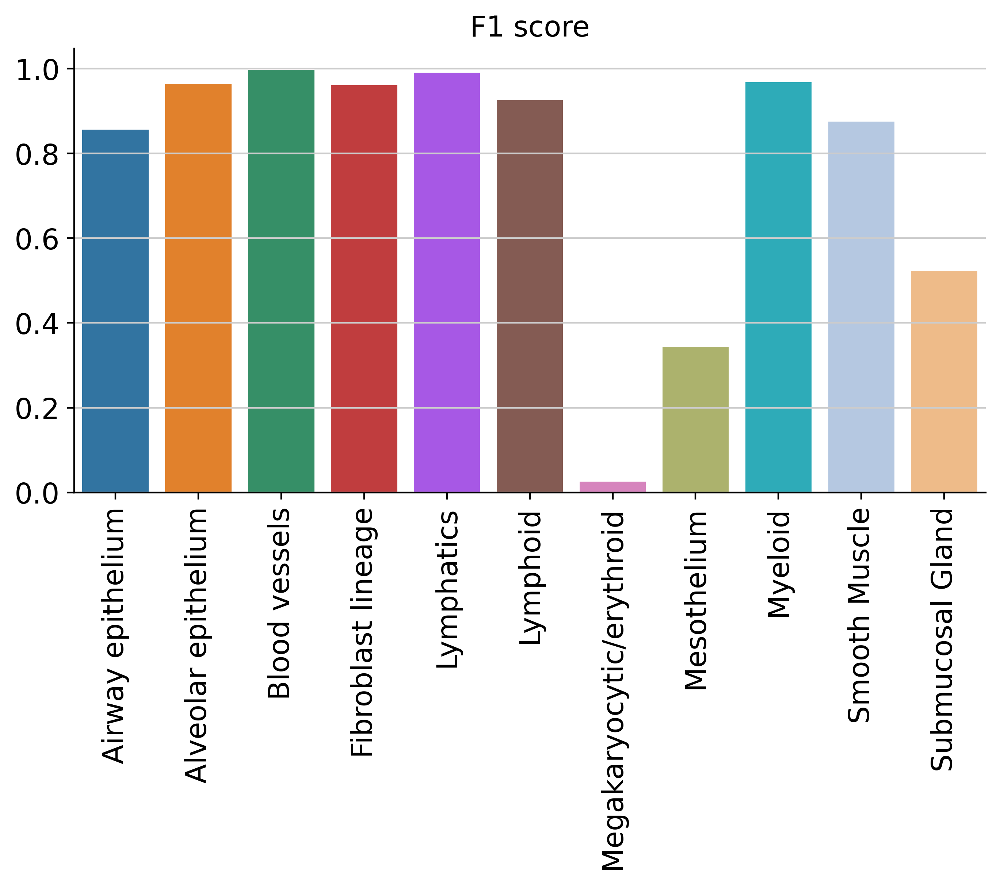

In [41]:
import seaborn as sns
fig, ax = plt.subplots(1, 1, figsize=(8, 4))
sns.barplot(
    list(results_dict['ann_level_2']['report'].keys())[:-3],
    f1_2,
)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
sns.despine()
ax.set_title('F1 score')

/home/icb/carlo.dedonno/anaconda3/envs/lataq/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'precision')

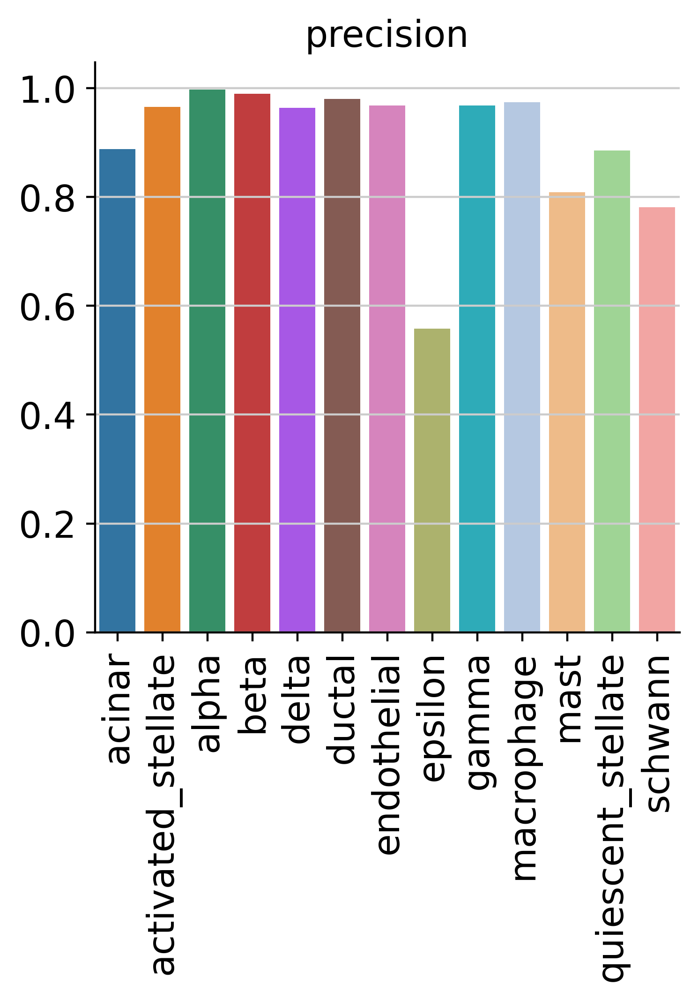

In [141]:
import seaborn as sns
fig, ax = plt.subplots(1, 1)
sns.barplot(
    list(results_dict['cell_type']['report'].keys())[:-4],
    prec,
)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
sns.despine()
ax.set_title('precision')

/home/icb/carlo.dedonno/anaconda3/envs/lataq/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'recall')

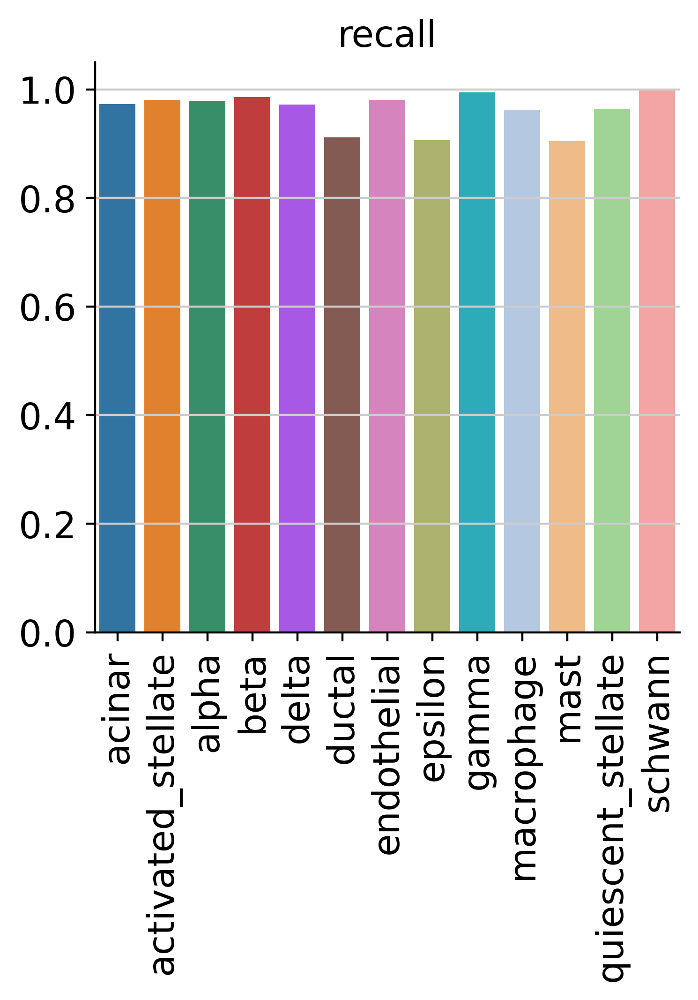

In [142]:
import seaborn as sns
fig, ax = plt.subplots(1, 1)
sns.barplot(
    list(results_dict['cell_type']['report'].keys())[:-4],
    recall,
)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
sns.despine()
ax.set_title('recall')